# Brainster Academy Final Project
### Team 3: Tatjana Veljkovic, Ilija Todorov, Ivana Tomovska Efremov

### Part Three

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import string
import nltk
nltk.download('punkt')
import re
from string import punctuation
from nltk.tokenize import WordPunctTokenizer, PunktSentenceTokenizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, PorterStemmer
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
import tqdm
from PIL import Image
from wordcloud import WordCloud, STOPWORDS

from statistics import mean

from scipy import spatial
from ast import literal_eval

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\USER\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [3]:
#!pip install pillow

In [4]:
#!pip install wordcloud

### Read data - 2011-2015

In [5]:
#tweets_clustered = pd.read_csv('VtorDel.csv')

In [6]:
#tweets_clustered.head(5)

### Read year 2014

In [7]:
tweets_clustered = pd.read_csv('VtorDel_2014.csv')

In [8]:
tweets_clustered.head(2)

,source,year,Tweets_cleaned,Cluster_labels,month,day_of_week,vectors
0,bbchealth,2014,experimental drug uk ebola nurse,4,12,2,"[1.417484164237976, -1.1779611110687256, 1.285..."
1,bbchealth,2014,ebola screen test scrutiny,5,12,2,"[-3.9630727767944336, 3.0754261016845703, 0.22..."


In [9]:
tweets_clustered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25995 entries, 0 to 25994
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   source          25995 non-null  object
 1   year            25995 non-null  int64 
 2   Tweets_cleaned  25984 non-null  object
 3   Cluster_labels  25995 non-null  int64 
 4   month           25995 non-null  int64 
 5   day_of_week     25995 non-null  int64 
 6   vectors         25995 non-null  object
dtypes: int64(4), object(3)
memory usage: 1.4+ MB


In [10]:
tweets_clustered['year'].value_counts().sort_index()

2014    25995
Name: year, dtype: int64

### Deleting NaN rows

In [11]:
tweets_clustered.shape

(25995, 7)

In [12]:
tweets_clustered['Tweets_cleaned'].isna().sum()

11

In [13]:
tweets_clustered.loc[tweets_clustered['Tweets_cleaned'].isna()]

,source,year,Tweets_cleaned,Cluster_labels,month,day_of_week,vectors
4711,cnnhealth,2014,NaN,2,10,2,"[0.21325577795505524, -0.08018049597740173, 0...."
9536,KaiserHealthNews,2014,NaN,2,9,2,"[-0.03316907957196236, 0.017922092229127884, -..."
13609,nprhealth,2014,NaN,2,12,6,"[0.017317550256848335, 0.024671141058206558, 0..."
13761,nprhealth,2014,NaN,2,11,2,"[-0.0035412709694355726, -0.003273812821134925..."
14149,nprhealth,2014,NaN,2,10,5,"[0.011944127269089222, 0.022619914263486862, -..."
14429,nprhealth,2014,NaN,2,9,1,"[0.023179005831480026, 0.030482450500130653, 0..."
14574,nprhealth,2014,NaN,2,8,2,"[-0.021652834489941597, -0.0038411139976233244..."
14738,nprhealth,2014,NaN,2,7,2,"[-0.028554407879710197, 0.01914793625473976, 0..."
14971,nprhealth,2014,NaN,2,6,6,"[-0.011250297538936138, 0.015049648471176624, ..."
15210,nprhealth,2014,NaN,2,5,1,"[0.019485848024487495, 0.01953030377626419, -0..."


In [14]:
tweets_clustered.dropna(subset=['Tweets_cleaned'], inplace=True)

In [15]:
tweets_clustered.shape

(25984, 7)

# General info

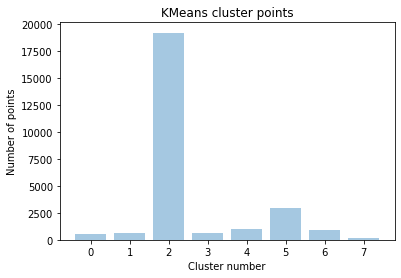

In [16]:
plt.bar([x for x in range(8)], tweets_clustered.groupby(['Cluster_labels'])['source'].count(), alpha = 0.4)
plt.title('KMeans cluster points')
plt.xlabel("Cluster number")
plt.ylabel("Number of points")
plt.show()

In [17]:
twitter_weekdays = tweets_clustered['day_of_week'].value_counts()
df_weekdays = pd.DataFrame(data=twitter_weekdays)
df_weekdays['Weekday'] = df_weekdays.index
df_weekdays.sort_values('Weekday')

,day_of_week,Weekday
0,4469,0
1,4981,1
2,4887,2
3,4986,3
4,4315,4
5,1328,5
6,1018,6


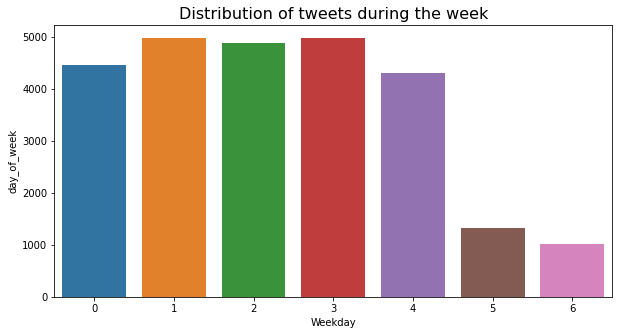

In [18]:
plt.figure(figsize = (10,5))
sns.barplot(y ='day_of_week', x = 'Weekday', data = df_weekdays)
plt.title('Distribution of tweets during the week', fontsize=16)
plt.show()

### Note: Most of the tweets are released during workdays (3 to 4 times more on workdays than during weekend days)

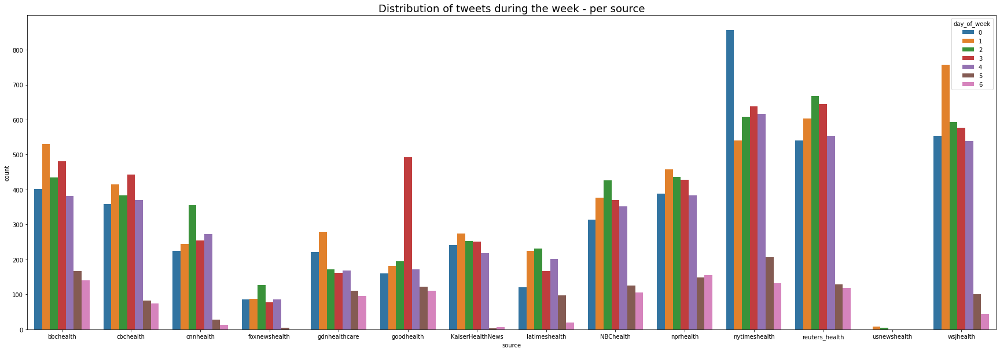

In [19]:
plt.figure(figsize = (30,10))
sns.countplot(x ='source', hue = "day_of_week", data = tweets_clustered)
plt.title('Distribution of tweets during the week - per source', fontsize=18)
plt.show()

### Note: Uneven distribution od tweets among sources, same pattern of tweets during days of the week

In [20]:
tweets_breakdown = tweets_clustered.groupby(['source', 'month']).count()
#tweets_breakdown[:50]

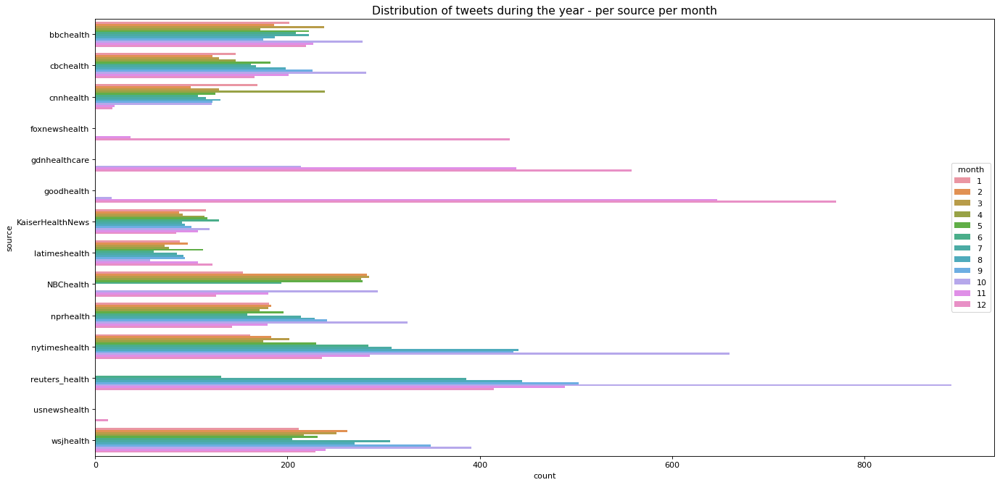

In [21]:
plt.figure(figsize=(20,10),dpi=80)
sns.countplot(data=tweets_clustered, y="source", hue="month")
plt.title('Distribution of tweets during the year - per source per month', fontsize=14)
plt.show()

### Note: With some of the sources there are no data in datasets about tweets within specific month of the year. Monthly tweet comparison will be analysed between two sources with similar monthly tweets distribution.

# Similarity of tweets - BBC and CBC

### jaccard_similarity (by month)

In [22]:
def jaccard_similarity(x,y):
    #""" returns the jaccard similarity between two lists """
    intersection_cardinality = len(set.intersection(*[set(x), set(y)]))
    union_cardinality = len(set.union(*[set(x), set(y)]))
    return intersection_cardinality/float(union_cardinality)

In [23]:
tweets_bbc = tweets_clustered[tweets_clustered['source'] == 'bbchealth']
tweets_cbc = tweets_clustered[tweets_clustered['source'] == 'cbchealth']

In [24]:
similarity_bymonth_jaccard = []

for i in range(1,13):
    bymonth_bbc = tweets_bbc[tweets_bbc['month'] == i]
    bymonth_cbc = tweets_cbc[tweets_cbc['month'] == i]
    bymonth_bbc_list = bymonth_bbc['Tweets_cleaned'].to_list()
    bymonth_cbc_list = bymonth_cbc['Tweets_cleaned'].to_list()

    bymonth = []

    for i in range(len(bymonth_bbc_list)):    
        sentence_bbc = [bymonth_bbc_list[i]]
        sentence_bbc = [sent.lower().split(" ") for sent in sentence_bbc]
        #print('bbc:', cluster_bbc)
        for j in range(len(bymonth_cbc_list)):
            sentence_cbc = [bymonth_cbc_list[j]]
            sentence_cbc = [sent.lower().split(" ") for sent in sentence_cbc]
            #print('cbc:',cluster_cbc)
            bymonth.append(jaccard_similarity(sentence_bbc[0], sentence_cbc[0]))
    s = mean(bymonth)
    similarity_bymonth_jaccard.append(s)
    bymonth = []

In [25]:
#print(mean(similarity_bymonth_jaccard))

### cosine similarity based on doc2vec (by month)

In [26]:
similarity_bymonth_doc2vec = []

for i in tqdm.tqdm(range(1,13)):
    bymonth_bbc = tweets_bbc[tweets_bbc['month'] == i]
    bymonth_cbc = tweets_cbc[tweets_cbc['month'] == i]
    bymonth_bbc_list = [literal_eval(el) for el in bymonth_bbc['vectors'].to_list()]
    bymonth_cbc_list = [literal_eval(el) for el in bymonth_cbc['vectors'].to_list()]

    bymonth = []

    for i in range(len(bymonth_bbc_list)):       
        for j in range(len(bymonth_cbc_list)):
            a = 1 - spatial.distance.cosine(bymonth_bbc_list[i], bymonth_cbc_list[j])
            bymonth.append(a)
    s = mean(bymonth)
    similarity_bymonth_doc2vec.append(s)
    bymonth = []

100%|██████████| 12/12 [00:24<00:00,  2.03s/it]


In [27]:
print(mean(similarity_bymonth_doc2vec))

0.34385755861245854


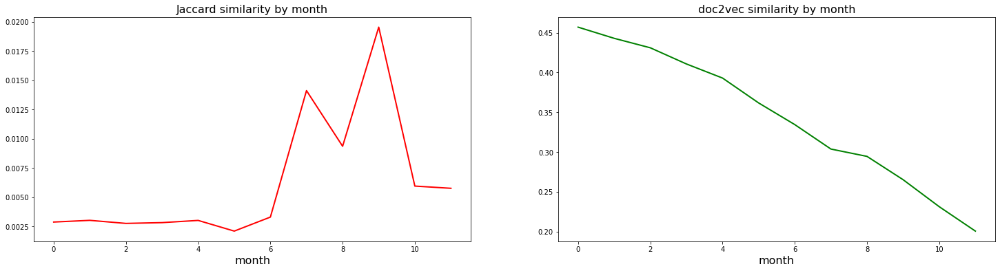

In [28]:
plt.figure(figsize=(25,6))
plt.subplot(1, 2, 1) # row 1, col 2 index 1
plt.title("Jaccard similarity by month", fontsize=16)
plt.plot(similarity_bymonth_jaccard, color='red', linewidth=2)
plt.xlabel('month', fontsize=16)

plt.subplot(1, 2, 2) # index 2
plt.title("doc2vec similarity by month", fontsize=16)
plt.plot(similarity_bymonth_doc2vec, color='green', linewidth=2)
plt.xlabel('month', fontsize=16)
plt.show()

## Note: Jaccard similarity shows higher similarity of words in the second half of the year, while cosine similarity based on doc2vec indicates higher similarity of tweets on the beginning of the year 0.45 which decreases by the end of the year to 0.20.

### similarity of clusters (by month)

In [29]:
similarity_bymonth = []

for i in range(1,13):
    bymonth_bbc = tweets_bbc[tweets_bbc['month'] == i]
    bymonth_cbc = tweets_cbc[tweets_cbc['month'] == i]
    bymonth_bbc_list = bymonth_bbc['Cluster_labels'].to_list()
    bymonth_cbc_list = bymonth_cbc['Cluster_labels'].to_list()

    bymonth = []

    for i in range(len(bymonth_bbc_list)):    
        cluster_bbc = [bymonth_bbc_list[i]]
        #print('bbc:', cluster_bbc)
        for j in range(len(bymonth_cbc_list)):
            cluster_cbc = [bymonth_cbc_list[j]]
            #print('cbc:',cluster_cbc)
            if cluster_bbc[0] == cluster_cbc[0]:
                bymonth.append(1)
    
    s = bymonth.count(1)/(len(bymonth_bbc_list)*len(bymonth_cbc_list))
    similarity_bymonth.append(s)

In [30]:
print(mean(similarity_bymonth))

0.6048736150998468


In [31]:
similarity_bymonth

[0.7921809304218093,
 0.733474352194606,
 0.7240570646863397,
 0.6325661038547308,
 0.7669537669537669,
 0.786815523657629,
 0.6304687921454388,
 0.3698752228163993,
 0.41337547408343867,
 0.3656691667942242,
 0.49369890634931074,
 0.5493480772404687]

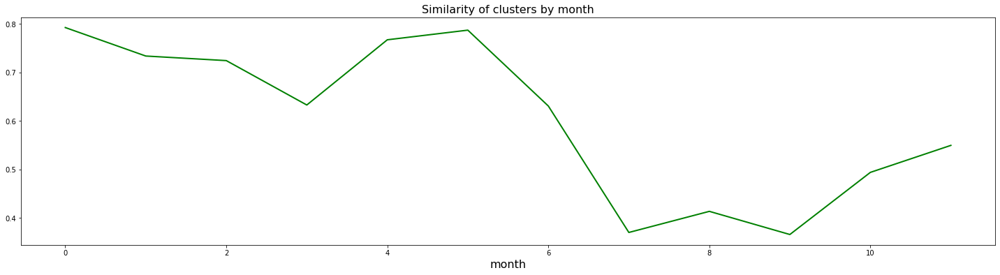

In [32]:
plt.figure(figsize=(25,6))
plt.title("Similarity of clusters by month", fontsize=16)
plt.plot(similarity_bymonth, color='green', linewidth=2)
plt.xlabel('month', fontsize=16)
plt.show()

## Note: similarity of tweets compared by clusters shows similar pattern like cosine similarity based on doc2vec.

### Word cloud BBC - CBC

In [33]:
#words = []
list_word_cloud_bbchealth = []
list_word_cloud_cbchealth = []
for i in tqdm.tqdm(range(1,13)):
    month_bbc = tweets_bbc[tweets_bbc['month'] == i]
    month_cbc = tweets_cbc[tweets_cbc['month'] == i]
    
    text_bbc = " ".join(cat for cat in month_bbc.Tweets_cleaned)
    text_cbc = " ".join(cat for cat in month_cbc.Tweets_cleaned)
    
    mask = np.array(Image.open("twitter-2012-negative-logo-5C6C1F1521-seeklogo.com.png"))

    word_cloud_bbchealth = WordCloud(
    width=5000,
    height=3000,
    random_state=1,
    mask=mask,
    background_color="white",
    colormap="ocean",
    collocations=False,
    stopwords=STOPWORDS,
    ).generate(text_bbc)
    
    word_cloud_cbchealth = WordCloud(
    width=5000,
    height=3000,
    random_state=1,
    mask=mask,    
    background_color="white",
    colormap="winter",
    collocations=False,
    stopwords=STOPWORDS,
    ).generate(text_cbc)
    
    list_word_cloud_bbchealth.append(word_cloud_bbchealth)
    list_word_cloud_cbchealth.append(word_cloud_cbchealth)

100%|██████████| 12/12 [00:11<00:00,  1.02it/s]


In [34]:
cal = { 0:'January', 1:"February", 2:'March', 3:'April', 4:'May', 5:'June', 6:'July', 7:'August', 8:'September', 9:'October', 10:'November', 11:'December'}

100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


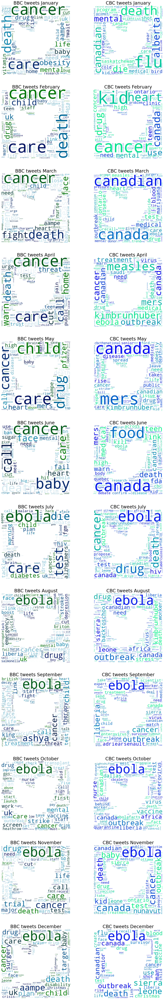

In [35]:
fig = plt.figure(figsize=(20,120))
count = 1

for i in tqdm.tqdm(range(len(cal))):
    ax = fig.add_subplot(12,2, count)
    ax.set_title(f'BBC tweets {cal[i]}', fontsize=30, color='black')
    ax.imshow(list_word_cloud_bbchealth[i])
    ax.axis("off")

    ax1 = fig.add_subplot(12,2, count+1)
    ax1.set_title(f'CBC tweets {cal[i]}', fontsize=30, color='black')
    ax1.imshow(list_word_cloud_cbchealth[i])
    ax1.axis("off")
    count += 2
plt.show()

## Note: Similarity of tweets of BBC and CBC increased in July with "ebola" being the hot topic

# Similarity of tweets - KaiserHealthNews and latimeshealth

### jaccard_similarity (by month)

In [36]:
tweets_KHN = tweets_clustered[tweets_clustered['source'] == 'KaiserHealthNews']
tweets_LAtimes = tweets_clustered[tweets_clustered['source'] == 'latimeshealth']
tweets_KHN_list = tweets_KHN['Tweets_cleaned'].to_list()
tweets_LAtimes_list = tweets_LAtimes['Tweets_cleaned'].to_list()

In [37]:
similarity_bymonth_jaccard_2 = []

for i in range(1,13):
    bymonth_KHN = tweets_KHN[tweets_KHN['month'] == i]
    bymonth_LAtimes = tweets_LAtimes[tweets_LAtimes['month'] == i]
    bymonth_LAtimes_list = bymonth_KHN['Tweets_cleaned'].to_list()
    bymonth_LAtimes_list = bymonth_LAtimes['Tweets_cleaned'].to_list()

    bymonth = []

    for i in range(len(bymonth_LAtimes_list)):    
        sentence_KHN = [bymonth_LAtimes_list[i]]
        sentence_KHN = [sent.lower().split(" ") for sent in sentence_KHN]
        
        for j in range(len(bymonth_LAtimes_list)):
            sentence_LAtimes = [bymonth_LAtimes_list[j]]
            sentence_LAtimes = [sent.lower().split(" ") for sent in sentence_LAtimes]
            #print('cbc:',cluster_cbc)
            bymonth.append(jaccard_similarity(sentence_KHN[0], sentence_LAtimes[0]))
    s = mean(bymonth)
    similarity_bymonth_jaccard_2.append(s)
    bymonth = []

In [38]:
similarity_bymonth_jaccard_2

[0.020853955244308057,
 0.016310142945577095,
 0.02094945039626138,
 0.017773028177995163,
 0.015352984160206026,
 0.02098449113659829,
 0.016773755304493116,
 0.019842369907279438,
 0.017330430266829403,
 0.023523186597249873,
 0.015916500083529645,
 0.01491422002067589]

###  cosine similarity based on doc2vec (by month)

In [39]:
similarity_bymonth_doc2vec_2 = []

for i in tqdm.tqdm(range(1,13)):
    bymonth_KHN = tweets_KHN[tweets_KHN['month'] == i]
    bymonth_LAtimes = tweets_LAtimes[tweets_LAtimes['month'] == i]
    bymonth_KHN_list = [literal_eval(el) for el in bymonth_KHN['vectors'].to_list()]
    bymonth_LAtimes_list = [literal_eval(el) for el in bymonth_LAtimes['vectors'].to_list()]

    bymonth = []

    for i in range(len(bymonth_KHN_list)):       
        for j in range(len(bymonth_LAtimes_list)):
            a = 1 - spatial.distance.cosine(bymonth_KHN_list[i], bymonth_LAtimes_list[j])
            bymonth.append(a)
    s = mean(bymonth)
    similarity_bymonth_doc2vec_2.append(s)
    bymonth = []

100%|██████████| 12/12 [00:06<00:00,  1.90it/s]


In [40]:
print(mean(similarity_bymonth_doc2vec_2))

0.09977366497627443


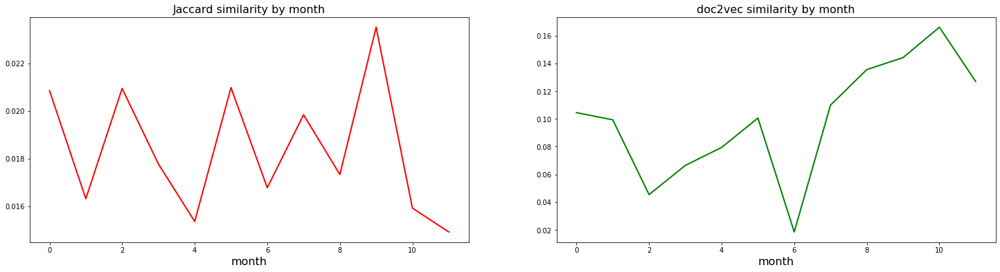

In [41]:
plt.figure(figsize=(25,6))
plt.subplot(1, 2, 1) # row 1, col 2 index 1
plt.title("Jaccard similarity by month", fontsize=16)
plt.plot(similarity_bymonth_jaccard_2, color='red', linewidth=2)
plt.xlabel('month', fontsize=16)

plt.subplot(1, 2, 2) # index 2
plt.title("doc2vec similarity by month", fontsize=16)
plt.plot(similarity_bymonth_doc2vec_2, color='green', linewidth=2)
plt.xlabel('month', fontsize=16)
plt.show()

## Note: jaccard similarity shows relatively stable pattern during Y2014 while cosine sinilarity based on doc2vec is lower in the first half of Y2014 (between 0.02 and 0.1) and increases to 0.16 in the second half of the year.

### similarity of clusters (by month)

In [42]:
similarity_bymonth_2 = []

for i in range(1,13):
    bymonth_KHN = tweets_KHN[tweets_KHN['month'] == i]
    bymonth_LAtimes = tweets_LAtimes[tweets_LAtimes['month'] == i]
    bymonth_KHN_list = bymonth_KHN['Cluster_labels'].to_list()
    bymonth_LAtimes_list = bymonth_LAtimes['Cluster_labels'].to_list()

    bymonth = []

    for i in range(len(bymonth_KHN_list)):    
        cluster_KHN = [bymonth_KHN_list[i]]
        
        for j in range(len(bymonth_LAtimes_list)):
            cluster_LAtimes = [bymonth_LAtimes_list[j]]
            
            if cluster_KHN[0] == cluster_LAtimes[0]:
                bymonth.append(1)
    
    s = 1 - bymonth.count(1)/(len(bymonth_KHN_list)*len(bymonth_LAtimes_list))
    similarity_bymonth_2.append(s)

In [43]:
similarity_bymonth_2

[0.2796442687747036,
 0.24341475095785436,
 0.24481074481074483,
 0.29494190020505806,
 0.1798687423687424,
 0.1521158978269157,
 0.1726797385620915,
 0.3771622253389434,
 0.3646236559139785,
 0.36355594869526753,
 0.29696916761289194,
 0.14344262295081966]

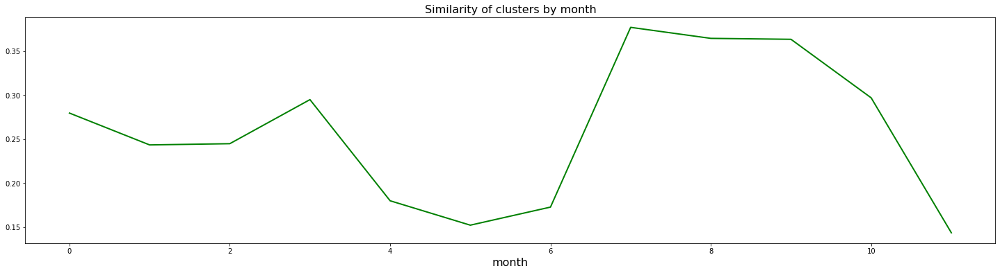

In [44]:
plt.figure(figsize=(25,6))
plt.title("Similarity of clusters by month", fontsize=16)
plt.plot(similarity_bymonth_2, color='green', linewidth=2)
plt.xlabel('month', fontsize=16)
plt.show()

## Note: similarity of tweets compared by clusters shows similar pattern like cosine similarity based on doc2vec.

### Word cloud KaiserHealthNews - latimeshealth 

In [45]:
#words = []
list_word_cloud_KHN = []
list_word_cloud_LAtimes = []
for i in tqdm.tqdm(range(1,13)):
    month_KHN = tweets_KHN[tweets_KHN['month'] == i]
    month_LAtimes = tweets_LAtimes[tweets_LAtimes['month'] == i]
    
    text_KHN = " ".join(cat for cat in month_KHN.Tweets_cleaned)
    text_LAtimes = " ".join(cat for cat in month_LAtimes.Tweets_cleaned)
    
    mask = np.array(Image.open("twitter-2012-negative-logo-5C6C1F1521-seeklogo.com.png"))

    word_cloud_KHN = WordCloud(
    width=5000,
    height=3000,
    random_state=1,
    mask=mask,
    background_color="white",
    colormap="crest_r", # ocean
    collocations=False,
    stopwords=STOPWORDS,
    ).generate(text_KHN)
    
    word_cloud_LAtimes = WordCloud(
    width=5000,
    height=3000,
    random_state=1,
    mask=mask,    
    background_color="white",
    colormap="winter",
    collocations=False,
    stopwords=STOPWORDS,
    ).generate(text_LAtimes)
    
    list_word_cloud_KHN.append(word_cloud_KHN)
    list_word_cloud_LAtimes.append(word_cloud_LAtimes)

100%|██████████| 12/12 [00:12<00:00,  1.03s/it]


In [46]:
cal = { 0:'January', 1:"February", 2:'March', 3:'April', 4:'May', 5:'June', 6:'July', 7:'August', 8:'September', 9:'October', 10:'November', 11:'December'}

100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


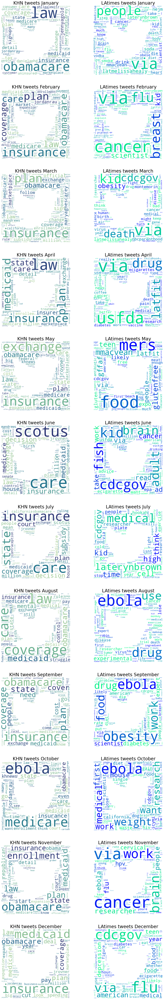

In [47]:
fig = plt.figure(figsize=(20,120)) #(100,300)
count = 1

for i in tqdm.tqdm(range(len(cal))):
    ax = fig.add_subplot(12,2, count)
    ax.set_title(f'KHN tweets {cal[i]}', fontsize=30, color='black')
    ax.imshow(list_word_cloud_KHN[i])
    ax.axis("off")

    ax1 = fig.add_subplot(12,2, count+1)
    ax1.set_title(f'LAtimes tweets {cal[i]}', fontsize=30, color='black')
    ax1.imshow(list_word_cloud_LAtimes[i])
    ax1.axis("off")
    count += 2
plt.show()

## Note: KHN and LAtimes have lower similarity of tweets compared to BBC and CBC. For KHN "Obamacare" was hot topic, while LAtimes dealth with more general health topic and with ebola in little lower intencity and one month later that BBC and CBC.

In [48]:
source = tweets_clustered['source'].unique().tolist()
#source

In [49]:
source_list_toshow = []

source_list = tweets_clustered['source'].unique().tolist()

for i in tqdm.tqdm(source_list):
    source_individual = tweets_clustered[tweets_clustered['source'] == i]
    text_source_individual = " ".join(cat for cat in source_individual.Tweets_cleaned)
    #mask = np.array(Image.open("twitter-2012-negative-logo-5C6C1F1521-seeklogo.com.png"))
    
    
    word_cloud_source = WordCloud(
    width=5000,
    height=3000,
    random_state=1,
    #mask=mask,
    background_color="white",
    colormap="winter",
    collocations=False,
    stopwords=STOPWORDS,
    ).generate(text_source_individual)
    
    source_list_toshow.append(word_cloud_source)

100%|██████████| 14/14 [07:37<00:00, 32.70s/it]


In [50]:
#source 

100%|██████████| 14/14 [00:15<00:00,  1.10s/it]


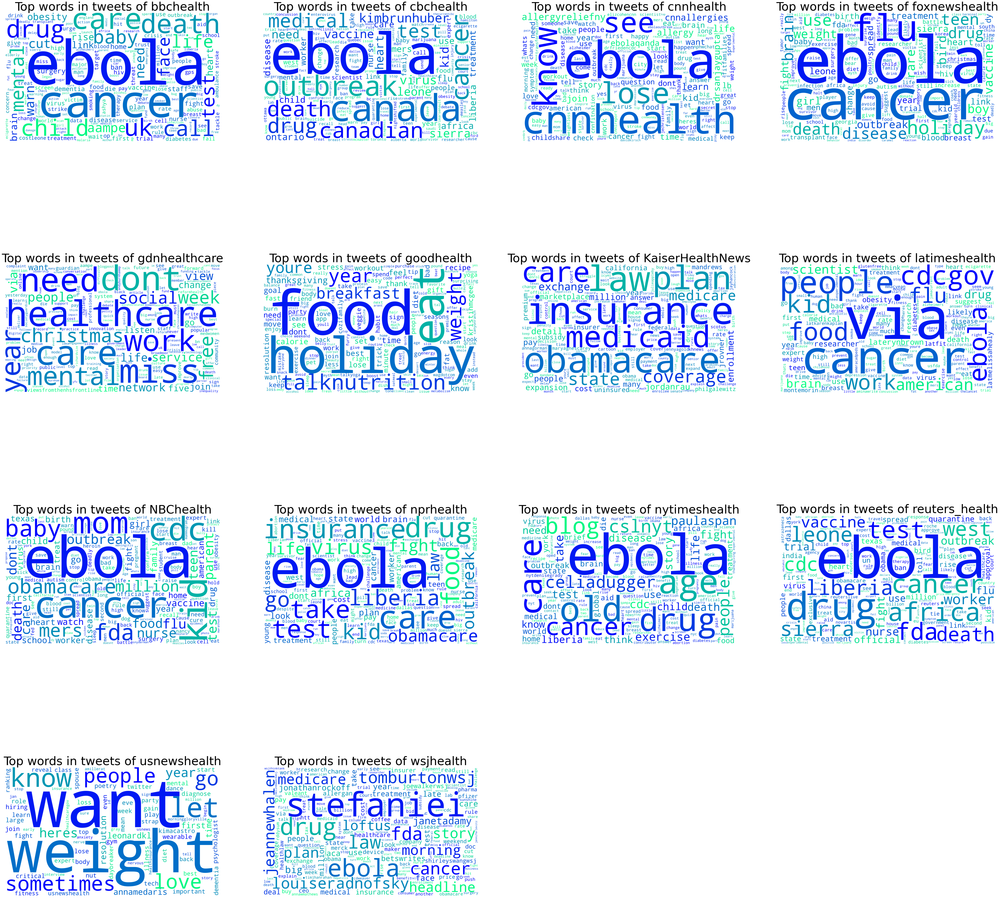

In [51]:
fig = plt.figure(figsize=(75,75))
count = 1

for i in tqdm.tqdm(range(len(source))):
    ax=fig.add_subplot(4,4, count)
    ax.imshow(source_list_toshow[i])
    plt.title((f'Top words in tweets of {source[i]}'), size=50)
    ax.axis("off")
    count += 1
plt.show()

## Note: Word cloud by source confirms the above stated. 